# PSplines in FSL-MRS

Description of the p-spline implementation in FSL-MRS.

P-splines are implmented as described in [Adaptive baseline fitting for 1H MR spectroscopy analysis by
Martin Wilson](https://doi.org/10.1002/mrm.28385).

You need fsl-mrs version 2.3.0 or higher

In [1]:
import fsl_mrs
fsl_mrs.__version__

'2.3.2+2.gc812920.dirty'

### Fetch some example data

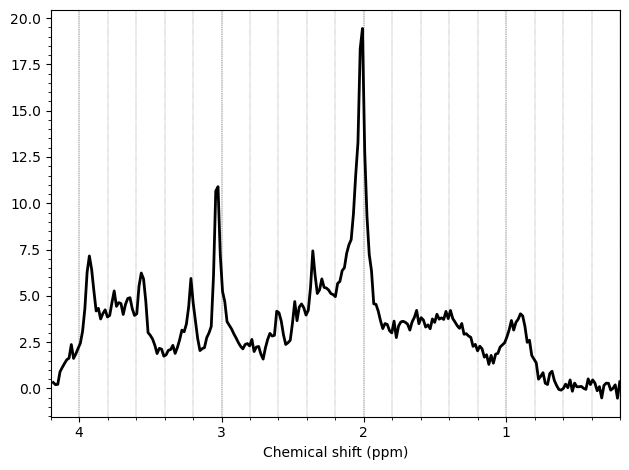

In [2]:
from fsl_mrs.utils.example import simulated
mrs = simulated(1)
_ = mrs.plot()

In [3]:
from fsl_mrs.utils import baseline
bobj = baseline.Baseline(
    mrs,
    ppmlim=(0.2, 4.2),
    baseline_selection="spline, stiff",
    baseline_order=None)

print(bobj)

p-spline (penalised spline) baseline with effective dimension 10 (stiff)


## Baseline regressor
Generated by the `Baseline` class using `baseline._spline_basis(n_points: int, n_spline: int, degree: int = 3)`

This contains a stacked list of spline functions at different frequency/chemical-shift positions. The first half of the matrix in one dimension contains the real regressors and the second the imaginary.

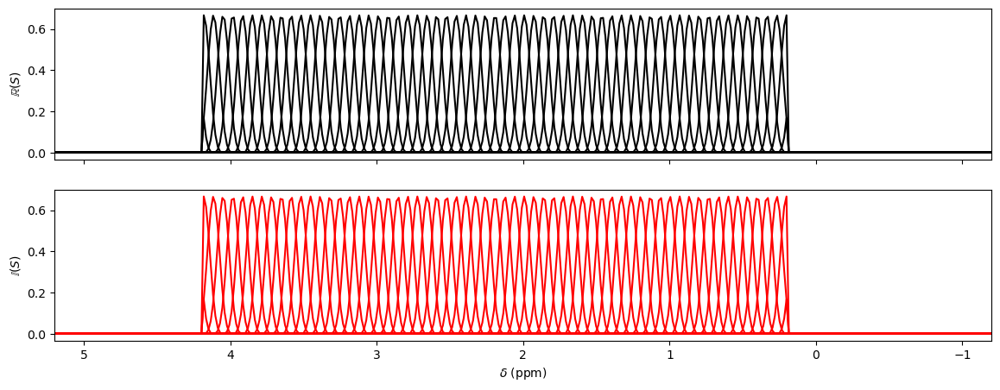

In [4]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(2, 1, figsize=(14, 5), sharex=True, sharey=True)
axes[0].plot(mrs.getAxes(), bobj.regressor[:, :63].real, 'k')
axes[1].plot(mrs.getAxes(), bobj.regressor[:, 63:].imag, 'r')
plt.xlim((5.2, -1.2))
plt.xlabel('$\delta$ (ppm)')
axes[0].set_ylabel('$\mathbb{R}(S)$')
axes[1].set_ylabel('$\mathbb{I}(S)$')
plt.show()

This baseline regressor is used and implemented through the code in exactly the same way an equivalent polynomial baseline is used, up until the loss and gradient functions are generated for the fitting.

In the main fit [function](https://git.fmrib.ox.ac.uk/fsl/fsl_mrs/-/blob/master/fsl_mrs/utils/fitting.py#L20),the [existing error function](https://git.fmrib.ox.ac.uk/fsl/fsl_mrs/-/blob/master/fsl_mrs/models/model_voigt.py#L215) is [modified](https://git.fmrib.ox.ac.uk/fsl/fsl_mrs/-/blob/master/fsl_mrs/utils/fitting.py#L110) to add a penalty term.  

This is done by adding the second term in Eqn 1 of the Wilson reference  
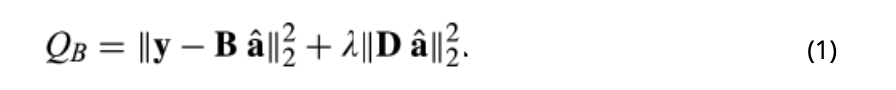,  
where __D__ is a second-order difference matrix  
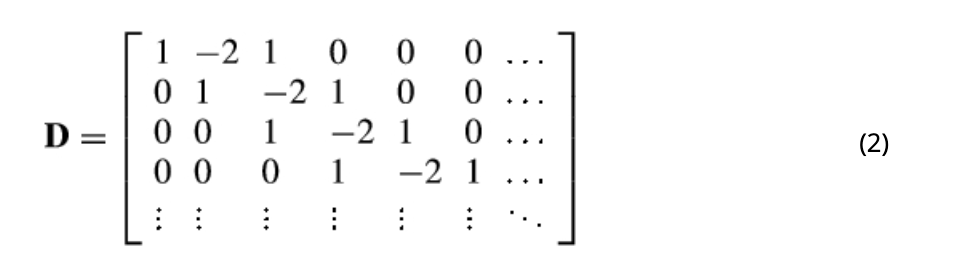.  

In the code this is performed in the [prepare_penalised_functions](https://git.fmrib.ox.ac.uk/fsl/fsl_mrs/-/blob/master/fsl_mrs/utils/baseline.py#L308) function. This function also used to modify the gradient function equivalently. The modified terms are then used in the normal Truncated Newton optimisation step.


In [5]:
from fsl_mrs import models
err_func, grad_func, forward, x2p, p2x = models.getModelFunctions('voigt')

g = 2  # Number of metab groups
mod_err_func, mod_grad_func = bobj.prepare_penalised_fit_functions(
            err_func,
            grad_func,
            lambda x: x2p(x, mrs.numBasis, g)[-1])


## Calculation of lambda (regularisation scaling term)

Lambda is set by defining a second parameter `ED` (effective dimension). The relationship between ED and lambda is given in Eqns 3,4 and 5 of Wilson. Qualitatively when lambda is large, and therefore maximum smoothness is enforced, ED tends to 2. When lambda is small, and there is no penalty for lack of smoothness, ED tends to the number of spline functions in B. If ED is 2, then you can think of the baseline having two degrees of freedom, i.e. it will fit a straight line.

In FSL-MRS you can specify a ED directly.

In [6]:
print(
    baseline.Baseline(
        mrs,
        ppmlim=(0.2, 4.2),
        baseline_selection="spline, 2",
        baseline_order=None))

print(
    baseline.Baseline(
        mrs,
        ppmlim=(0.2, 4.2),
        baseline_selection="spline, 20",
        baseline_order=None))

p-spline (penalised spline) baseline with effective dimension 2.0
p-spline (penalised spline) baseline with effective dimension 20.0


or you can give one of a few descriptive smoothness qualifiers:
- 'very-stiff'
- 'stiff'
- 'moderate'
- 'flexible'
- 'very-flexible'

In [7]:
print(
    baseline.Baseline(
        mrs,
        ppmlim=(0.2, 4.2),
        baseline_selection="spline, stiff",
        baseline_order=None))

print(
    baseline.Baseline(
        mrs,
        ppmlim=(0.2, 4.2),
        baseline_selection="spline, very-flexible",
        baseline_order=None))

p-spline (penalised spline) baseline with effective dimension 10 (stiff)
p-spline (penalised spline) baseline with effective dimension 50 (very-flexible)


### Fitting example

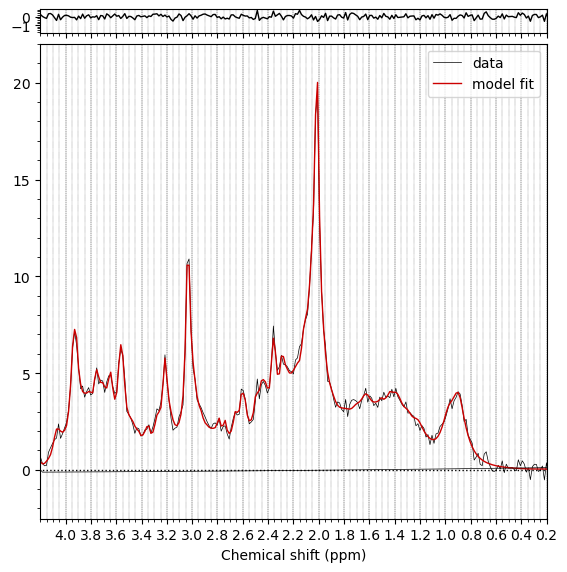

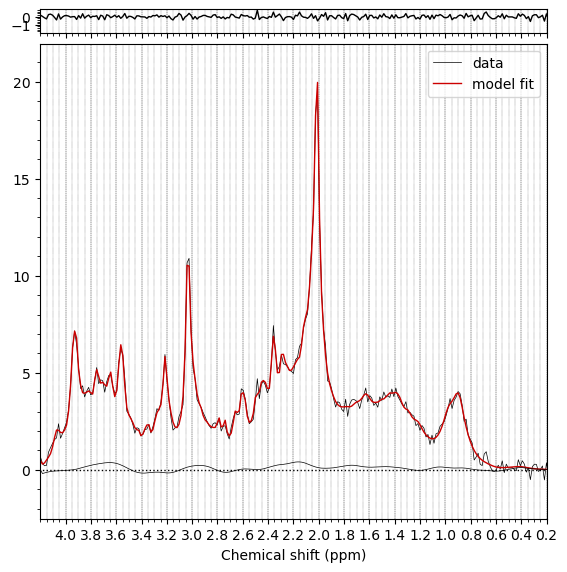

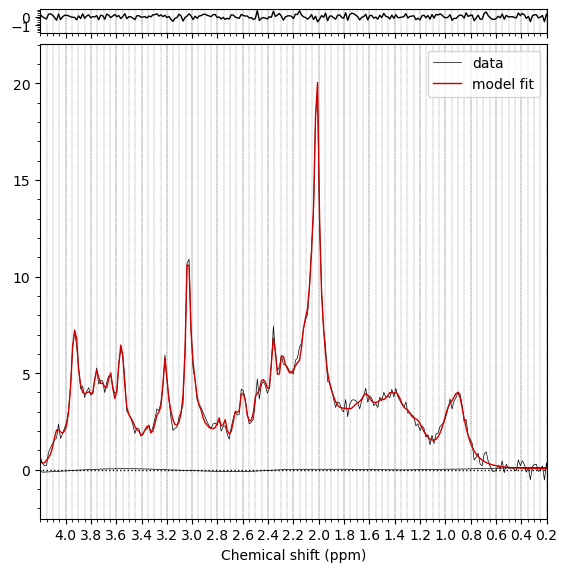

In [8]:
# Default polynomial (order 2)
fig = mrs.fit().plot(mrs)
fig.set_size_inches(5.5, 5.5)

# Default spline, flexible
fig = mrs.fit(baseline='spline, flexible').plot(mrs)
fig.set_size_inches(5.5, 5.5)

# Default spline, stiff
fig = mrs.fit(baseline='spline, stiff').plot(mrs)
fig.set_size_inches(5.5, 5.5)

## Look at covariance

In [9]:
from fsl_mrs.utils import plotting
res_stiff = mrs.fit(baseline='spline, stiff')
plotting.plot_corr(res_stiff, corr=res_stiff.corr)

In [10]:
plotting.plot_general_corr(res_stiff.cov, res_stiff.params_names)

# Monte Carlo sim   

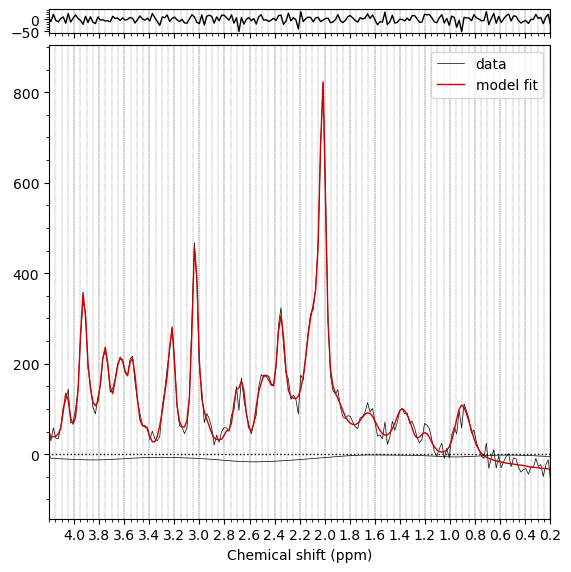

In [11]:
import fsl_mrs.utils.synthetic as syn
from copy import deepcopy

import numpy as np

basis_file = './fsl_mrs/tests/testdata/fsl_mrs/steam_basis'

noiseless_fid, basemrs, trueconcs = syn.syntheticFromBasisFile(
    basis_file,
    ignore=['Ala', 'Asc', 'GSH', 'PE', 'Scyllo'],
    metab_groups=['Mac'],
    ind_scaling=['Mac',],
    concentrations={'Mac': 15},
    baseline=(-10,-10, 1, 1),
    baseline_ppm=(0.2, 4.2),
    broadening=[(20.0, 20.0), (0.0, 20.0)],
    noisecovariance=[[0.0]],
    points=512,
    bandwidth=3000)

noiseless_mrs = deepcopy(basemrs)
noiseless_mrs.FID = noiseless_fid

rng = np.random.default_rng()
def add_noise(level):
    noise = rng.standard_normal(noiseless_mrs.numPoints) * (level / np.sqrt(2))\
        + 1j * rng.standard_normal(noiseless_mrs.numPoints) * (level / np.sqrt(2))
    this_mrs = deepcopy(noiseless_mrs)
    this_mrs.FID = this_mrs.FID + noise
    return this_mrs

mrs = add_noise(20)
mg = mrs.parse_metab_groups('Mac')
fig = mrs.fit(metab_groups=mg, baseline='spline, stiff').plot(mrs)
fig.set_size_inches(5.5, 5.5)

In [12]:
import pandas as pd
mc_results = []
mc_crlb_results = []
mc_corr_results = []

for rep in range(50):
    res = add_noise(20).fit(metab_groups=mg, baseline='spline, stiff')
    mc_results.append(res.fitResults.iloc[0])
    mc_crlb_results.append(res.crlb)
    mc_corr_results.append(res.corr)
mc_df = pd.concat(mc_results, ignore_index=True, axis=1)
df_crlb = pd.DataFrame(np.stack(np.sqrt(mc_crlb_results))[:,:-1], columns=res.params_names).T
mean_corr = np.mean(mc_corr_results, axis=0)

In [14]:
# Single instance correlations
plotting.plot_general_corr(mean_corr,res.params_names)

In [15]:
# MC corr
plotting.plot_general_corr(mc_df.T.corr().to_numpy(), mc_df.index.to_list())

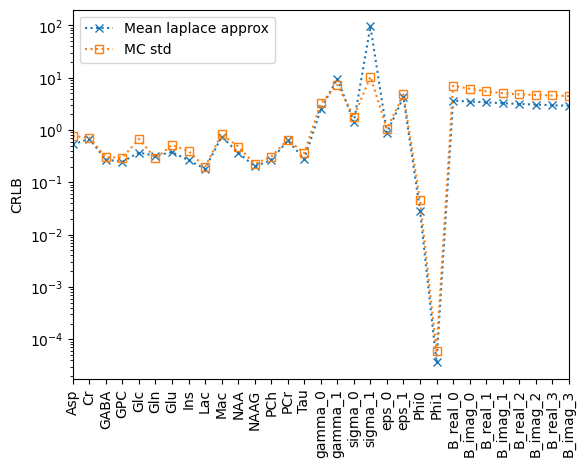

In [27]:
plt.semilogy(df_crlb.mean(axis=1),'x:', label='Mean laplace approx')
plt.semilogy(mc_df.std(axis=1),'s:', label='MC std', markerfacecolor='none')
plt.legend()
plt.xticks(rotation = 90)
plt.xlim([0, 30])
plt.ylabel('CRLB')
plt.show()